In [1]:
# cd to root projetc

In [2]:
cd ~/mva/recvis/project/cmn/

/Users/quentinleroy/mva/recvis/project/cmn


In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pylab as plt
import matplotlib.patches as patches

%matplotlib inline
from skimage.io import imread
import skimage

In [6]:
path_data = "./exp-visgeno-rel/data/imdb/"
imdb_trn = np.load(path_data + "imdb_trn.npy")
imdb_tst = np.load(path_data + "imdb_tst.npy")
imdb_val = np.load(path_data + "imdb_val.npy")

In [7]:
print("trn shape", imdb_trn.shape)
print("tst shape", imdb_tst.shape)
print("val shape", imdb_val.shape)

trn shape (77398,)
tst shape (5000,)
val shape (5000,)


In [87]:
def print_bbox(bboxes, style='r-', color='#00FF00', linewidth=5):
    """A utility function to help visualizing boxes."""
    bboxes = np.array(bboxes).reshape((-1, 4))
    for bbox in bboxes:
        xmin, ymin, xmax, ymax = bbox
        xmin-=(linewidth+3)
        ymin-=(linewidth+3)
        xmax+=(linewidth+3)
        ymax+=(linewidth+3)
        plt.plot([xmin, xmax, xmax, xmin, xmin],
                 [ymin, ymin, ymax, ymax, ymin], style, color=color, linewidth=linewidth)

# Load relationships.json from Visual genome

In [8]:
import json

In [9]:
with open('./visual-genome/relationships.json') as json_data:
    relationships = json.load(json_data)    

In [28]:
with open('./visual-genome/objects.json') as json_data:
    objects = json.load(json_data)    

In [31]:
len(d)

108077

In [32]:
im0 = objects[0]

In [33]:
im0

{'image_id': 1,
 'image_url': 'https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg',
 'objects': [{'h': 557,
   'merged_object_ids': [],
   'names': ['trees'],
   'object_id': 1058549,
   'synsets': ['tree.n.01'],
   'w': 799,
   'x': 0,
   'y': 0},
  {'h': 290,
   'merged_object_ids': [5046],
   'names': ['sidewalk'],
   'object_id': 1058534,
   'synsets': ['sidewalk.n.01'],
   'w': 722,
   'x': 78,
   'y': 308},
  {'h': 538,
   'merged_object_ids': [],
   'names': ['building'],
   'object_id': 1058508,
   'synsets': ['building.n.01'],
   'w': 222,
   'x': 1,
   'y': 0},
  {'h': 258,
   'merged_object_ids': [3798578],
   'names': ['street'],
   'object_id': 1058539,
   'synsets': ['street.n.01'],
   'w': 359,
   'x': 439,
   'y': 283},
  {'h': 535,
   'merged_object_ids': [],
   'names': ['wall'],
   'object_id': 1058543,
   'synsets': ['wall.n.01'],
   'w': 135,
   'x': 0,
   'y': 1},
  {'h': 360,
   'merged_object_ids': [],
   'names': ['tree'],
   'object_id': 1058545,
   'synset

In [30]:
len(objects)

108077

In [29]:
type(objects)

list

In [13]:
im0 = d[0]

In [16]:
for key in im0:
    print(key)

relationships
image_id


In [18]:
print(im0['image_id'])

1


In [27]:
print('number of relationships in im0', len(im0['relationships']))
rel0 = im0['relationships'][0]
for key in rel0:
    print(key)
print('subject', rel0['subject'])
print('predicate', rel0['predicate'])
print('object', rel0['object'])

number of relationships in im0 41
predicate
object
relationship_id
synsets
subject
subject {'name': 'shade', 'h': 192, 'synsets': ['shade.n.01'], 'object_id': 5045, 'w': 274, 'y': 338, 'x': 119}
predicate ON
object {'h': 290, 'object_id': 1058534, 'merged_object_ids': [5046], 'synsets': ['sidewalk.n.01'], 'w': 722, 'y': 308, 'x': 78, 'names': ['sidewalk']}


In [10]:
d

[{'image_id': 1,
  'relationships': [{'object': {'h': 290,
     'merged_object_ids': [5046],
     'names': ['sidewalk'],
     'object_id': 1058534,
     'synsets': ['sidewalk.n.01'],
     'w': 722,
     'x': 78,
     'y': 308},
    'predicate': 'ON',
    'relationship_id': 15927,
    'subject': {'h': 192,
     'name': 'shade',
     'object_id': 5045,
     'synsets': ['shade.n.01'],
     'w': 274,
     'x': 119,
     'y': 338},
    'synsets': ['along.r.01']},
   {'object': {'h': 28,
     'merged_object_ids': [5048],
     'names': ['shoes'],
     'object_id': 1058525,
     'synsets': ['shoe.n.01'],
     'w': 48,
     'x': 388,
     'y': 485},
    'predicate': 'wears',
    'relationship_id': 15928,
    'subject': {'h': 262,
     'name': 'man',
     'object_id': 1058529,
     'synsets': ['man.n.01'],
     'w': 60,
     'x': 238,
     'y': 249},
    'synsets': ['wear.v.01']},
   {'object': {'h': 15,
     'name': 'headlight',
     'object_id': 5050,
     'synsets': ['headlight.n.01'],
     '

In [13]:
def get_image(data):
    path = data['im_path']
    im = imread(path)
    return im

In [ ]:
def get

In [18]:
im = get_image(imdb_trn[0])

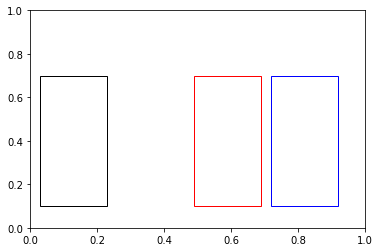

In [26]:
import matplotlib.patches as patches

fig7 = plt.figure()
ax7 = fig7.add_subplot(111)
for p in [
    patches.Rectangle(
        (0.03, 0.1), 0.2, 0.6, fill=False,
        edgecolor=None      # Default
    ),
    patches.Rectangle(
        (0.26, 0.1), 0.2, 0.6, fill=False,
        edgecolor="none"     # No border
    ),
    patches.Rectangle(
        (0.49, 0.1), 0.2, 0.6, fill=False,
        edgecolor="red"
    ),
    patches.Rectangle(
        (0.72, 0.1), 0.2, 0.6, fill=False,
        edgecolor="#0000ff"
    ),
]:
    ax7.add_patch(p)
fig7.savefig('rect7.png', dpi=90, bbox_inches='tight')

In [ ]:
patches.Rectangle

In [47]:
def get_rectangle(data, i):
    bboxes = data['bboxes'][i]
    x, y, xx, yy = bboxes
    width = xx - x
    height = yy - y
    return x, y, width, height

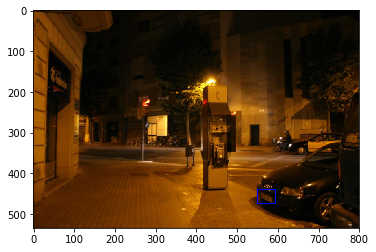

In [90]:
fig, ax = plt.subplots()

i = i + 1
batch_idx = 1
assert(i<len(imdb_trn[batch_idx]['bboxes']))
data = imdb_trn[batch_idx]
im = get_image(data)
x, y, width, height = get_rectangle(data, i)
p = patches.Rectangle(
        (x, y), width, height, fill=False,
        edgecolor="#0000ff"
    )
ax.add_patch(p)

plt.imshow(im)



In [93]:
np.maximum(np.array([0, 0, 0, 1]), 0)

array([0, 0, 0, 1])

In [22]:
np.min(bboxes)

5

In [21]:
np.max(bboxes)

787

In [20]:
bboxes = imdb_trn[0]['bboxes']

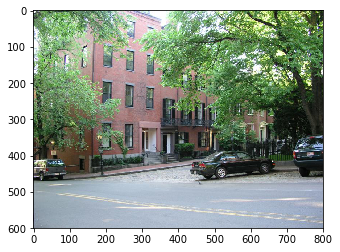

In [96]:
plt.imshow(get_image(imdb_trn[100]))

In [95]:
imdb_trn[100]

{'bboxes': [[432, 382, 666, 459],
  [720, 345, 797, 427],
  [716, 345, 798, 450],
  [36, 410, 95, 460],
  [0, 409, 91, 465],
  [0, 469, 796, 597],
  [69, 497, 798, 590],
  [118, 32, 430, 255],
  [173, 297, 232, 393],
  [244, 305, 295, 388],
  [147, 34, 390, 372],
  [137, 10, 397, 391],
  [167, 171, 257, 286],
  [239, 185, 290, 293],
  [150, 21, 453, 385],
  [151, 15, 420, 353],
  [305, 202, 344, 292],
  [238, 97, 302, 178],
  [91, 12, 440, 350],
  [609, 343, 725, 438],
  [331, 277, 510, 346],
  [41, 0, 688, 455],
  [145, 35, 570, 389],
  [615, 296, 647, 325],
  [609, 297, 672, 373],
  [323, 365, 379, 430],
  [86, 425, 451, 472],
  [220, 419, 398, 467],
  [55, 467, 790, 585],
  [155, 439, 581, 576],
  [3, 406, 240, 474],
  [158, 335, 221, 387],
  [38, 371, 482, 498],
  [210, 20, 474, 412],
  [14, 15, 199, 393],
  [0, 400, 97, 471],
  [9, 399, 99, 487],
  [358, 241, 417, 310],
  [287, 308, 332, 363],
  [375, 367, 475, 410],
  [405, 368, 674, 477],
  [394, 26, 746, 303],
  [358, 331, 416,

In [38]:
d[52]['relationships']

[{'object': {'h': 170,
   'name': 'window',
   'object_id': 1062013,
   'synsets': ['window.n.01'],
   'w': 46,
   'x': 607,
   'y': 53},
  'predicate': 'has',
  'relationship_id': 3188534,
  'subject': {'h': 335,
   'name': 'building',
   'object_id': 1062012,
   'synsets': ['building.n.01'],
   'w': 288,
   'x': 470,
   'y': 4},
  'synsets': ['have.v.01']},
 {'object': {'h': 335,
   'name': 'building',
   'object_id': 1062012,
   'synsets': ['building.n.01'],
   'w': 288,
   'x': 470,
   'y': 4},
  'predicate': 'of a',
  'relationship_id': 4245038,
  'subject': {'h': 165,
   'name': 'window',
   'object_id': 3786803,
   'synsets': ['window.n.01'],
   'w': 110,
   'x': 225,
   'y': 116},
  'synsets': []},
 {'object': {'h': 170,
   'name': 'window',
   'object_id': 1062013,
   'synsets': ['window.n.01'],
   'w': 46,
   'x': 607,
   'y': 53},
  'predicate': 'has',
  'relationship_id': 3188536,
  'subject': {'h': 335,
   'name': 'building',
   'object_id': 1062012,
   'synsets': ['buildi

In [92]:
class Image():
    
    def __init__(self, im):
        self.bboxes = im['bboxes']
        self.im_path = im['im_path']
        self.image_id = im['image_id']
        self.mapped_rels = im['mapped_rels']
        self.obj_idx_map = im['obj_idx_map']
        # load image
        self.im = skimage.io.imread(self.im_path)
        # num bboxes
        self.num_bboxes = len(self.bboxes)
        # num mapped rels
        self.num_mapped_rels = len(self.mapped_rels)
        # num objects
        self.num_obj = len(self.obj_idx_map)
        # rels
        self.rels = [Relation(mapped_rel) for mapped_rel in self.mapped_rels]
        
    def draw_relation(self, idx):
        if idx >= len(self.rels):
            print('idx too high for number of relations')
            return
        rel = self.rels[idx]
        b1, b2 = self.bboxes[rel.idx_obj1], self.bboxes[rel.idx_obj2]
        plt.imshow(self.im)
        print_bbox(b1, '-', color='#FF0000')
        print_bbox(b2, '--', color='#00FF00')
        plt.axis('off')
        plt.title(rel.__str__())

In [68]:
class Relation():
    
    def __init__(self, mapped_rel):
        self.idx_obj1 = mapped_rel[0]
        self.idx_obj2 = mapped_rel[1]
        self.subj = mapped_rel[2]
        self.rel = mapped_rel[3]
        self.obj = mapped_rel[4]
        
    def __str__(self):
        return self.subj + " " + self.rel + " " + self.obj

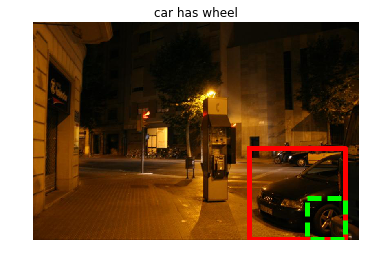

In [97]:
I = Image(imdb_trn[1])
I.draw_relation(10)

In [36]:
imdb_trn[1]

{'bboxes': [[538, 317, 757, 524],
  [607, 53, 652, 222],
  [470, 4, 757, 338],
  [225, 116, 334, 280],
  [426, 159, 450, 183],
  [405, 177, 497, 452],
  [526, 273, 560, 334],
  [583, 307, 638, 355],
  [603, 284, 637, 345],
  [268, 217, 288, 241],
  [246, 200, 294, 379],
  [21, 85, 95, 442],
  [20, 368, 84, 458],
  [620, 295, 759, 354],
  [272, 252, 336, 338],
  [548, 439, 593, 473],
  [375, 433, 514, 532],
  [679, 438, 758, 524],
  [364, 158, 447, 394],
  [103, 354, 562, 533],
  [117, 320, 610, 390],
  [431, 259, 483, 386],
  [539, 370, 712, 525],
  [368, 324, 401, 386],
  [265, 211, 291, 238],
  [126, 20, 414, 342],
  [226, 295, 380, 341],
  [5, 3, 196, 478],
  [272, 6, 469, 399],
  [690, 301, 719, 324]],
 'im_path': './exp-visgeno-rel/visgeno-dataset/VG_100K_2/53.jpg',
 'image_id': 53,
 'mapped_rels': [(2, 1, 'building', 'has', 'window'),
  (3, 2, 'window', 'of a', 'building'),
  (2, 1, 'building', 'has', 'window'),
  (6, 2, 'entrance', 'OF', 'building'),
  (8, 7, 'person', 'riding',